In [1]:
# Run this cell to import pyspark and to define start_spark() and stop_spark()

import findspark

findspark.init()

import getpass
import pandas
import pyspark
import random
import re

from IPython.display import display, HTML
from pyspark import SparkContext
from pyspark.sql import SparkSession


# Functions used below

def username():
    """Get username with any domain information removed.
    """

    return re.sub('@.*', '', getpass.getuser())


def dict_to_html(d):
    """Convert a Python dictionary into a two column table for display.
    """

    html = []

    html.append(f'<table width="100%" style="width:100%; font-family: monospace;">')
    for k, v in d.items():
        html.append(f'<tr><td style="text-align:left;">{k}</td><td>{v}</td></tr>')
    html.append(f'</table>')

    return ''.join(html)


def show_as_html(df, n=20):
    """Leverage existing pandas jupyter integration to show a spark dataframe as html.
    
    Args:
        n (int): number of rows to show (default: 20)
    """

    display(df.limit(n).toPandas())

    
def display_spark():
    """Display the status of the active Spark session if one is currently running.
    """
    
    if 'spark' in globals() and 'sc' in globals():

        name = sc.getConf().get("spark.app.name")
        
        html = [
            f'<p><b>Spark</b></p>',
            f'<p>The spark session is <b><span style="color:green">active</span></b>, look for <code>{name}</code> under the running applications section in the Spark UI.</p>',
            f'<ul>',
            f'<li><a href="http://mathmadslinux2p.canterbury.ac.nz:8080/" target="_blank">Spark UI</a></li>',
            f'<li><a href="{sc.uiWebUrl}" target="_blank">Spark Application UI</a></li>',
            f'</ul>',
            f'<p><b>Config</b></p>',
            dict_to_html(dict(sc.getConf().getAll())),
            f'<p><b>Notes</b></p>',
            f'<ul>',
            f'<li>The spark session <code>spark</code> and spark context <code>sc</code> global variables have been defined by <code>start_spark()</code>.</li>',
            f'<li>Please run <code>stop_spark()</code> before closing the notebook or restarting the kernel or kill <code>{name}</code> by hand using the link in the Spark UI.</li>',
            f'</ul>',
        ]
        display(HTML(''.join(html)))
        
    else:
        
        html = [
            f'<p><b>Spark</b></p>',
            f'<p>The spark session is <b><span style="color:red">stopped</span></b>, confirm that <code>{username() + " (jupyter)"}</code> is under the completed applications section in the Spark UI.</p>',
            f'<ul>',
            f'<li><a href="http://mathmadslinux2p.canterbury.ac.nz:8080/" target="_blank">Spark UI</a></li>',
            f'</ul>',
        ]
        display(HTML(''.join(html)))


# Functions to start and stop spark

def start_spark(executor_instances=2, executor_cores=1, worker_memory=1, master_memory=1):
    """Start a new Spark session and define globals for SparkSession (spark) and SparkContext (sc).
    
    Args:
        executor_instances (int): number of executors (default: 2)
        executor_cores (int): number of cores per executor (default: 1)
        worker_memory (float): worker memory (default: 1)
        master_memory (float): master memory (default: 1)
    """

    global spark
    global sc

    user = username()
    
    cores = executor_instances * executor_cores
    partitions = cores * 4
    port = 4000 + random.randint(1, 999)

    spark = (
        SparkSession.builder
        .master("spark://masternode2:7077")
        .config("spark.driver.extraJavaOptions", f"-Dderby.system.home=/tmp/{user}/spark/")
        .config("spark.dynamicAllocation.enabled", "false")
        .config("spark.executor.instances", str(executor_instances))
        .config("spark.executor.cores", str(executor_cores))
        .config("spark.cores.max", str(cores))
        .config("spark.executor.memory", f"{worker_memory}g")
        .config("spark.driver.memory", f"{master_memory}g")
        .config("spark.driver.maxResultSize", "0")
        .config("spark.sql.shuffle.partitions", str(partitions))
        .config("spark.ui.port", str(port))
        .appName(user + " (jupyter)")
        .getOrCreate()
    )
    sc = SparkContext.getOrCreate()
    
    display_spark()

    
def stop_spark():
    """Stop the active Spark session and delete globals for SparkSession (spark) and SparkContext (sc).
    """

    global spark
    global sc

    if 'spark' in globals() and 'sc' in globals():

        spark.stop()

        del spark
        del sc

    display_spark()


# Make css changes to improve spark output readability

html = [
    '<style>',
    'pre { white-space: pre !important; }',
    'table.dataframe td { white-space: nowrap !important; }',
    'table.dataframe thead th:first-child, table.dataframe tbody th { display: none; }',
    '</style>',
]
display(HTML(''.join(html)))

In [2]:
# Run this cell to start a spark session in this notebook

start_spark(executor_instances=4, executor_cores=2, worker_memory=4, master_memory=4)

spark.dynamicAllocation.enabled,false
spark.executor.instances,4
spark.ui.port,4342
spark.driver.port,36259
spark.driver.memory,4g
spark.executor.memory,4g
spark.master,spark://masternode2:7077
spark.executor.id,driver
spark.executor.cores,2
spark.driver.host,mathmadslinux2p.canterbury.ac.nz
spark.sql.shuffle.partitions,32


In [3]:
# Write your imports and code here or insert cells below

from pyspark.sql import Row, DataFrame, Window, functions as F
from pyspark.sql.types import *

## Question 04

### The data stored in HDFS under hdfs:///data/ has a replication factor of 8 and is distributed evenly across the worker nodes. You should always be able to load and apply transformations to multiple years of daily in parallel.
### Again, you should only use part of the daily climate summaries while you are still developing your code so that you can use fewer resources to get preliminary results without waiting all day.

### (a) Count the number of rows in daily.

In [5]:
# Load the data
data = spark.read.csv("hdfs:///data/ghcnd/daily/*.csv.gz")


schema_routes = StructType([
    StructField("ID", StringType(), True),
    StructField("DATE", StringType(), True),
    StructField("ELEMENT", StringType(), True),
    StructField("VALUE", FloatType(), True),
    StructField("MEASUREMENT_FLAG", StringType(), True),
    StructField("QUALITY_FLAG", StringType(), True),
    StructField("SOURCE_FLAG", StringType(), True),
    StructField("OBSERVATION_TIME", TimestampType(), True),
])
alldaily = (
    spark.read.format("com.databricks.spark.csv")
    .option("header", "false")
    .option("inferSchema", "false")
    .schema(schema_routes)
    .load("hdfs:///data/ghcnd/daily/*.csv.gz")
)
alldaily.show(10)

# Count the number of rows
count = data.count()

print(f"Number of rows in daily: {count}")


+-----------+--------+-------+-----+----------------+------------+-----------+----------------+
|         ID|    DATE|ELEMENT|VALUE|MEASUREMENT_FLAG|QUALITY_FLAG|SOURCE_FLAG|OBSERVATION_TIME|
+-----------+--------+-------+-----+----------------+------------+-----------+----------------+
|AE000041196|20100101|   TMAX|259.0|            null|        null|          S|            null|
|AE000041196|20100101|   TMIN|120.0|            null|        null|          S|            null|
|AE000041196|20100101|   TAVG|181.0|               H|        null|          S|            null|
|AEM00041194|20100101|   TMAX|250.0|            null|        null|          S|            null|
|AEM00041194|20100101|   TMIN|168.0|            null|        null|          S|            null|
|AEM00041194|20100101|   PRCP|  0.0|            null|        null|          S|            null|
|AEM00041194|20100101|   TAVG|194.0|               H|        null|          S|            null|
|AEM00041217|20100101|   TMAX|250.0|    

### (b) Filter daily using the filter command to obtain the subset of observations containing the five core elements described in inventory.

### How many observations are there for each of the five core elements?

### Which element has the most observations?

In [6]:
from pyspark.sql.functions import col

# List of the five core elements from the inventory
core_elements = ["TMAX", "TMIN", "PRCP", "SNOW", "SNWD"]

# Filter the DataFrame for the core elements
filtered_data = alldaily.filter(alldaily["ELEMENT"].isin(core_elements))

# Count the number of observations for each element
element_counts = filtered_data.groupBy('ELEMENT').count()

# Show the counts
element_counts.show()

# Find the element with the most observations
max_element = element_counts.orderBy('count', ascending=False).first()
print("Element with most observations: ", max_element['ELEMENT'])

+-------+----------+
|ELEMENT|     count|
+-------+----------+
|   SNWD| 297846434|
|   SNOW| 353904309|
|   TMIN| 454759421|
|   PRCP|1069105193|
|   TMAX| 455946095|
+-------+----------+

Element with most observations:  PRCP


### (c) Many stations collect TMIN and TMAX, but do not necessarily report them simultaneously due to issues with data collection or coverage. Determine how many observations of TMIN do not have a corresponding observation of TMAX.

In [7]:
from pyspark.sql.functions import count, when

# Filter TMIN and TMAX data
tmin_tmax_data = alldaily.filter((alldaily["ELEMENT"] == "TMIN") | (alldaily["ELEMENT"] == "TMAX"))

In [9]:
# Group by station and date, and count observations
station_date_counts = tmin_tmax_data.groupBy(
    "ID", "DATE").agg(
    count(when(limited_data["ELEMENT"] == "TMIN", True)).alias("TMIN_count"), 
    count(when(limited_data["ELEMENT"] == "TMAX", True)).alias("TMAX_count"))
show_as_html(station_date_counts,10)

,ID,DATE,TMIN_count,TMAX_count
0,ASN00004106,20090101,1,1
1,ASN00005094,20090101,1,1
2,ASN00008290,20090101,1,1
3,ASN00009965,20090101,1,1
4,ASN00014277,20090101,1,1
5,ASN00014609,20090101,1,1
6,ASN00029058,20090101,1,1
7,ASN00039104,20090101,1,1
8,ASN00040068,20090101,1,1
9,ASN00040284,20090101,1,1


In [10]:
# Find stations with missing TMAX observations
missing_tmax_observations = station_date_counts.filter((station_date_counts["TMIN_count"] > 0) & (station_date_counts["TMAX_count"] == 0))

show_as_html(missing_tmax_observations,10)

# Count observations with missing TMAX
observations_with_missing_tmax_count = missing_tmax_observations.count()

print(f"Number of observations with missing TMAX: {observations_with_missing_tmax_count}")

,ID,DATE,TMIN_count,TMAX_count
0,AGM00060581,20110101,1,0
1,ARM00087289,20110101,1,0
2,ASN00040223,20110101,1,0
3,BXM00096315,20110101,1,0
4,CA002201450,20110101,1,0
5,COM00080110,20110101,1,0
6,HUM00012772,20110101,1,0
7,IRM00040879,20110101,1,0
8,MP000061988,20110101,1,0
9,NHM00091565,20110101,1,0


Number of observations with missing TMAX: 9322723


### How many unique stations contributed to these observations?


In [11]:
# Count unique stations contributing to missing TMAX observations
unique_missing_tmax_stations = missing_tmax_observations.select("ID").distinct()
unique_missing_tmax_stations_count =unique_missing_tmax_stations.count()
unique_missing_tmax_stations.show()



print(f"Number of unique stations contributing to missing TMAX: {unique_missing_tmax_stations_count}")

+-----------+
|         ID|
+-----------+
|AGE00147719|
|AQC00914873|
|AR000875850|
|ARM00087022|
|ARM00087480|
|ARM00087904|
|ASN00003069|
|ASN00006011|
|ASN00009111|
|ASN00009965|
|ASN00011003|
|ASN00012022|
|ASN00018040|
|ASN00021020|
|ASN00022802|
|ASN00022803|
|ASN00023057|
|ASN00026013|
|ASN00029139|
|ASN00031016|
+-----------+
only showing top 20 rows

Number of unique stations contributing to missing TMAX: 27927


### (d) Filter daily to obtain all observations of TMIN and TMAX for all stations in New Zealand,and save the result to your output directory.

In [9]:
station_data = spark.read.parquet("/user/uwi14/outputs/ghcnd/Final_stations_df.parquet")
station_data.printSchema()
show_as_html(station_data,10)

root
 |-- ID: string (nullable = true)
 |-- STATE: string (nullable = true)
 |-- CODE: string (nullable = true)
 |-- LATITUDE: string (nullable = true)
 |-- LONGITUDE: string (nullable = true)
 |-- ELEVATION: string (nullable = true)
 |-- NAME: string (nullable = true)
 |-- GSN_FLAG: string (nullable = true)
 |-- HCN_CRN_FLAG: string (nullable = true)
 |-- WMO_ID: string (nullable = true)
 |-- Country_Name: string (nullable = true)
 |-- State_Name: string (nullable = true)
 |-- FIRST_ACTIVE_YEAR: string (nullable = true)
 |-- LAST_ACTIVE_YEAR: string (nullable = true)
 |-- DIFFERENT_ELEMENTS_COUNT: long (nullable = true)
 |-- CORE_ELEMENTS_COUNT: long (nullable = true)
 |-- OTHER_ELEMENTS_COUNT: long (nullable = true)
 |-- COLLECTED_ELEMENTS: array (nullable = true)
 |    |-- element: string (containsNull = true)



,ID,STATE,CODE,LATITUDE,LONGITUDE,ELEVATION,NAME,GSN_FLAG,HCN_CRN_FLAG,WMO_ID,Country_Name,State_Name,FIRST_ACTIVE_YEAR,LAST_ACTIVE_YEAR,DIFFERENT_ELEMENTS_COUNT,CORE_ELEMENTS_COUNT,OTHER_ELEMENTS_COUNT,COLLECTED_ELEMENTS
0,AE000041196,,AE,25.3330,55.5170,34.0,SHARJAH INTER. AIRP,GSN,,41196,United Arab Emirates,None,1944,2024,4,3,1.0,"[TMAX, TMIN, PRCP, TAVG]"
1,AEM00041218,,AE,24.2620,55.6090,264.9,AL AIN INTL,,,41218,United Arab Emirates,None,1994,2024,4,3,1.0,"[TMAX, TMIN, PRCP, TAVG]"
2,AGE00147715,,AG,35.4200,8.1197,863.0,TEBESSA,,,,Algeria,None,1879,1938,3,3,NaN,"[TMAX, TMIN, PRCP]"
3,AGE00147794,,AG,36.7800,5.1000,225.0,BEJAIA-CAP CARBON,,,,Algeria,None,1926,1938,2,2,NaN,"[TMAX, TMIN]"
4,AGM00060402,,AG,36.7120,5.0700,6.1,SOUMMAM,,,60402,Algeria,None,    ,2024,5,4,1.0,"[TMAX, TMIN,     , PRCP, SNWD]"
5,AGM00060430,,AG,36.3000,2.2330,721.0,MILIANA,,,60430,Algeria,None,1957,2024,5,4,1.0,"[TMAX, TMIN, PRCP, SNWD, TAVG]"
6,AGM00060461,,AG,35.7000,-0.6500,22.0,ORAN-PORT,,,60461,Algeria,None,1995,2024,4,3,1.0,"[TMAX, TMIN, PRCP, TAVG]"
7,AGM00060514,,AG,35.1670,2.3170,801.0,KSAR CHELLALA,,,60514,Algeria,None,1995,2024,5,4,1.0,"[TMAX, TMIN, PRCP, SNWD, TAVG]"
8,AGM00060515,,AG,35.3330,4.2060,459.0,BOU SAADA,,,60515,Algeria,None,1984,2024,4,3,1.0,"[TMAX, TMIN, PRCP, TAVG]"
9,AGM00060550,,AG,33.6670,1.0000,1347.0,EL-BAYADH,,,60550,Algeria,None,1973,2024,5,4,1.0,"[TMAX, TMIN, PRCP, SNWD, TAVG]"


In [10]:
All_data_df= alldaily.join(station_data,
                                    on="ID",
                                    how="left")
show_as_html(All_data_df,10)

,ID,DATE,ELEMENT,VALUE,MEASUREMENT_FLAG,QUALITY_FLAG,SOURCE_FLAG,OBSERVATION_TIME,STATE,CODE,...,HCN_CRN_FLAG,WMO_ID,Country_Name,State_Name,FIRST_ACTIVE_YEAR,LAST_ACTIVE_YEAR,DIFFERENT_ELEMENTS_COUNT,CORE_ELEMENTS_COUNT,OTHER_ELEMENTS_COUNT,COLLECTED_ELEMENTS
0,AE000041196,20100101,TMAX,259.0,None,None,S,NaT,,AE,...,,41196,United Arab Emirates,None,1944,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
1,AE000041196,20100101,TMIN,120.0,None,None,S,NaT,,AE,...,,41196,United Arab Emirates,None,1944,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
2,AE000041196,20100101,TAVG,181.0,H,None,S,NaT,,AE,...,,41196,United Arab Emirates,None,1944,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
3,AEM00041194,20100101,TMAX,250.0,None,None,S,NaT,,AE,...,,41194,United Arab Emirates,None,1983,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
4,AEM00041194,20100101,TMIN,168.0,None,None,S,NaT,,AE,...,,41194,United Arab Emirates,None,1983,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
5,AEM00041194,20100101,PRCP,0.0,None,None,S,NaT,,AE,...,,41194,United Arab Emirates,None,1983,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
6,AEM00041194,20100101,TAVG,194.0,H,None,S,NaT,,AE,...,,41194,United Arab Emirates,None,1983,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
7,AEM00041217,20100101,TMAX,250.0,None,None,S,NaT,,AE,...,,41217,United Arab Emirates,None,1983,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
8,AEM00041217,20100101,TMIN,146.0,None,None,S,NaT,,AE,...,,41217,United Arab Emirates,None,1983,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
9,AEM00041217,20100101,TAVG,199.0,H,None,S,NaT,,AE,...,,41217,United Arab Emirates,None,1983,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"


In [26]:
# Filter data for TMIN and TMAX observations
tmin_tmax_data = All_data_df.filter((col("ELEMENT") == "TMIN") | (col("ELEMENT") == "TMAX"))
tmin_tmax_data.show()

+-----------+--------+-------+-----+----------------+------------+-----------+----------------+-----+----+--------+---------+---------+--------------------+--------+------------+------+--------------------+----------+-----------------+----------------+------------------------+-------------------+--------------------+--------------------+
|         ID|    DATE|ELEMENT|VALUE|MEASUREMENT_FLAG|QUALITY_FLAG|SOURCE_FLAG|OBSERVATION_TIME|STATE|CODE|LATITUDE|LONGITUDE|ELEVATION|                NAME|GSN_FLAG|HCN_CRN_FLAG|WMO_ID|        Country_Name|State_Name|FIRST_ACTIVE_YEAR|LAST_ACTIVE_YEAR|DIFFERENT_ELEMENTS_COUNT|CORE_ELEMENTS_COUNT|OTHER_ELEMENTS_COUNT|  COLLECTED_ELEMENTS|
+-----------+--------+-------+-----+----------------+------------+-----------+----------------+-----+----+--------+---------+---------+--------------------+--------+------------+------+--------------------+----------+-----------------+----------------+------------------------+-------------------+--------------------+--

In [29]:
# Filter for stations in New Zealand 
nz_stations_all = tmin_tmax_data .filter(tmin_tmax_data["Country_Name"].contains("New Zealand"))
show_as_html(nz_stations_all ,10)

,ID,DATE,ELEMENT,VALUE,MEASUREMENT_FLAG,QUALITY_FLAG,SOURCE_FLAG,OBSERVATION_TIME,STATE,CODE,...,HCN_CRN_FLAG,WMO_ID,Country_Name,State_Name,FIRST_ACTIVE_YEAR,LAST_ACTIVE_YEAR,DIFFERENT_ELEMENTS_COUNT,CORE_ELEMENTS_COUNT,OTHER_ELEMENTS_COUNT,COLLECTED_ELEMENTS
0,CWM00091843,20100101,TMIN,228.0,None,None,S,NaT,,CW,...,,91843,Cook Islands [New Zealand],None,1973,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
1,NZ000093292,20100101,TMAX,297.0,None,None,S,NaT,,NZ,...,,93292,New Zealand,None,1962,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
2,NZ000093292,20100101,TMIN,74.0,None,None,S,NaT,,NZ,...,,93292,New Zealand,None,1962,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
3,NZ000093417,20100101,TMAX,180.0,None,None,S,NaT,,NZ,...,,93420,New Zealand,None,1972,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
4,NZ000093417,20100101,TMIN,125.0,None,None,S,NaT,,NZ,...,,93420,New Zealand,None,1972,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
5,NZ000093844,20100101,TMAX,232.0,None,None,S,NaT,,NZ,...,,93845,New Zealand,None,1948,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
6,NZ000093844,20100101,TMIN,96.0,None,None,S,NaT,,NZ,...,,93845,New Zealand,None,1948,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
7,NZ000933090,20100101,TMAX,197.0,None,None,S,NaT,,NZ,...,,93309,New Zealand,None,1944,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
8,NZ000933090,20100101,TMIN,82.0,None,None,S,NaT,,NZ,...,,93309,New Zealand,None,1944,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
9,NZ000936150,20100101,TMAX,324.0,None,None,S,NaT,,NZ,...,,93781,New Zealand,None,1964,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"


In [32]:
# Filter for stations in New Zealand 
nz_tmin_tmax = nz_stations_all.filter(nz_stations_all["CODE"].contains("NZ"))
show_as_html(nz_tmin_tmax  ,10)


,ID,DATE,ELEMENT,VALUE,MEASUREMENT_FLAG,QUALITY_FLAG,SOURCE_FLAG,OBSERVATION_TIME,STATE,CODE,...,HCN_CRN_FLAG,WMO_ID,Country_Name,State_Name,FIRST_ACTIVE_YEAR,LAST_ACTIVE_YEAR,DIFFERENT_ELEMENTS_COUNT,CORE_ELEMENTS_COUNT,OTHER_ELEMENTS_COUNT,COLLECTED_ELEMENTS
0,NZ000093292,20100101,TMAX,297.0,None,None,S,NaT,,NZ,...,,93292,New Zealand,None,1962,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
1,NZ000093292,20100101,TMIN,74.0,None,None,S,NaT,,NZ,...,,93292,New Zealand,None,1962,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
2,NZ000093417,20100101,TMAX,180.0,None,None,S,NaT,,NZ,...,,93420,New Zealand,None,1972,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
3,NZ000093417,20100101,TMIN,125.0,None,None,S,NaT,,NZ,...,,93420,New Zealand,None,1972,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
4,NZ000093844,20100101,TMAX,232.0,None,None,S,NaT,,NZ,...,,93845,New Zealand,None,1948,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
5,NZ000093844,20100101,TMIN,96.0,None,None,S,NaT,,NZ,...,,93845,New Zealand,None,1948,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
6,NZ000933090,20100101,TMAX,197.0,None,None,S,NaT,,NZ,...,,93309,New Zealand,None,1944,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
7,NZ000933090,20100101,TMIN,82.0,None,None,S,NaT,,NZ,...,,93309,New Zealand,None,1944,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
8,NZ000936150,20100101,TMAX,324.0,None,None,S,NaT,,NZ,...,,93781,New Zealand,None,1964,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
9,NZM00093110,20100101,TMAX,215.0,None,None,S,NaT,,NZ,...,,93110,New Zealand,None,1994,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"


In [33]:
nz_tmin_tmax2 = nz_tmin_tmax.drop("COLLECTED_ELEMENTS")

In [34]:
output_dir_csv = "hdfs:///user/uwi14/outputs/ghcnd/nz_tmin_tmax2.csv"
nz_tmin_tmax2.write.mode("overwrite").option("header", "true").option("compression", "gzip").csv(output_dir_csv)

In [35]:
output_dir = "hdfs:///user/uwi14/outputs/ghcnd/nz_tmin_tmax.parquet"
nz_tmin_tmax.write.mode("overwrite").option("compression", "snappy").parquet(output_dir)


In [36]:
!hdfs dfs -du -h /user/uwi14/outputs/ghcnd/

5.0 M    20.1 M  /user/uwi14/outputs/ghcnd/Final_stations_df.parquet
1.5 M    6.0 M   /user/uwi14/outputs/ghcnd/Modified_Inventory_df.parquet
256.0 K  1.0 M   /user/uwi14/outputs/ghcnd/avg_rainfall.csv
1.9 K    7.5 K   /user/uwi14/outputs/ghcnd/countries_df.csv
2.3 M    9.2 M   /user/uwi14/outputs/ghcnd/joined_countries_df.csv
2.3 M    9.2 M   /user/uwi14/outputs/ghcnd/joined_countries_state_df.csv
2.3 K    9.0 K   /user/uwi14/outputs/ghcnd/modified_countries_df.csv
865      3.4 K   /user/uwi14/outputs/ghcnd/modified_states_df.csv
2.1 M    8.3 M   /user/uwi14/outputs/ghcnd/nz_tmin_tmax.parquet
2.8 M    11.3 M  /user/uwi14/outputs/ghcnd/nz_tmin_tmax2.csv
7.5 K    29.8 K  /user/uwi14/outputs/ghcnd/sorted_stations_nz_df.csv
623      2.4 K   /user/uwi14/outputs/ghcnd/states_df.csv


In [27]:
nz_data = spark.read.parquet("/user/uwi14/outputs/ghcnd/nz_tmin_tmax.parquet")
nz_data.printSchema()
show_as_html(nz_data,10)

root
 |-- ID: string (nullable = true)
 |-- DATE: string (nullable = true)
 |-- ELEMENT: string (nullable = true)
 |-- VALUE: float (nullable = true)
 |-- MEASUREMENT_FLAG: string (nullable = true)
 |-- QUALITY_FLAG: string (nullable = true)
 |-- SOURCE_FLAG: string (nullable = true)
 |-- OBSERVATION_TIME: timestamp (nullable = true)
 |-- STATE: string (nullable = true)
 |-- CODE: string (nullable = true)
 |-- LATITUDE: string (nullable = true)
 |-- LONGITUDE: string (nullable = true)
 |-- ELEVATION: string (nullable = true)
 |-- NAME: string (nullable = true)
 |-- GSN_FLAG: string (nullable = true)
 |-- HCN_CRN_FLAG: string (nullable = true)
 |-- WMO_ID: string (nullable = true)
 |-- Country_Name: string (nullable = true)
 |-- State_Name: string (nullable = true)
 |-- FIRST_ACTIVE_YEAR: string (nullable = true)
 |-- LAST_ACTIVE_YEAR: string (nullable = true)
 |-- DIFFERENT_ELEMENTS_COUNT: long (nullable = true)
 |-- CORE_ELEMENTS_COUNT: long (nullable = true)
 |-- OTHER_ELEMENTS_COUNT

,ID,DATE,ELEMENT,VALUE,MEASUREMENT_FLAG,QUALITY_FLAG,SOURCE_FLAG,OBSERVATION_TIME,STATE,CODE,...,HCN_CRN_FLAG,WMO_ID,Country_Name,State_Name,FIRST_ACTIVE_YEAR,LAST_ACTIVE_YEAR,DIFFERENT_ELEMENTS_COUNT,CORE_ELEMENTS_COUNT,OTHER_ELEMENTS_COUNT,COLLECTED_ELEMENTS
0,NZ000093012,20040101,TMAX,234.0,None,None,G,NaT,,NZ,...,,93119,New Zealand,None,1965,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
1,NZ000093012,20040101,TMIN,106.0,None,None,G,NaT,,NZ,...,,93119,New Zealand,None,1965,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
2,NZ000093292,20040101,TMAX,240.0,None,None,G,NaT,,NZ,...,,93292,New Zealand,None,1962,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
3,NZ000093292,20040101,TMIN,101.0,None,None,G,NaT,,NZ,...,,93292,New Zealand,None,1962,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
4,NZ000093417,20040101,TMAX,204.0,None,None,G,NaT,,NZ,...,,93420,New Zealand,None,1972,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
5,NZ000093417,20040101,TMIN,142.0,None,None,G,NaT,,NZ,...,,93420,New Zealand,None,1972,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
6,NZ000093844,20040101,TMAX,230.0,None,None,G,NaT,,NZ,...,,93845,New Zealand,None,1948,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
7,NZ000093844,20040101,TMIN,147.0,None,None,G,NaT,,NZ,...,,93845,New Zealand,None,1948,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
8,NZ000093994,20040101,TMAX,251.0,None,None,G,NaT,,NZ,...,,93997,New Zealand,None,1940,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
9,NZ000093994,20040101,TMIN,209.0,None,None,G,NaT,,NZ,...,,93997,New Zealand,None,1940,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"


### How many observations are there, and how many years are covered by the observations?

In [13]:
# Count the total number of observations
totalObservations = nz_data.count()
print(f"Total number of observations for New Zealand: {totalObservations}")

Total number of observations for New Zealand: 485520


In [28]:
from pyspark.sql.functions import to_date, col, when

In [29]:
# convert the string data type of the "DATE" to date data type
nz_data = nz_data.withColumn("DATE", to_date(col("DATE"), "yyyyMMdd"))
nz_data.printSchema()
show_as_html(nz_data,10)

root
 |-- ID: string (nullable = true)
 |-- DATE: date (nullable = true)
 |-- ELEMENT: string (nullable = true)
 |-- VALUE: float (nullable = true)
 |-- MEASUREMENT_FLAG: string (nullable = true)
 |-- QUALITY_FLAG: string (nullable = true)
 |-- SOURCE_FLAG: string (nullable = true)
 |-- OBSERVATION_TIME: timestamp (nullable = true)
 |-- STATE: string (nullable = true)
 |-- CODE: string (nullable = true)
 |-- LATITUDE: string (nullable = true)
 |-- LONGITUDE: string (nullable = true)
 |-- ELEVATION: string (nullable = true)
 |-- NAME: string (nullable = true)
 |-- GSN_FLAG: string (nullable = true)
 |-- HCN_CRN_FLAG: string (nullable = true)
 |-- WMO_ID: string (nullable = true)
 |-- Country_Name: string (nullable = true)
 |-- State_Name: string (nullable = true)
 |-- FIRST_ACTIVE_YEAR: string (nullable = true)
 |-- LAST_ACTIVE_YEAR: string (nullable = true)
 |-- DIFFERENT_ELEMENTS_COUNT: long (nullable = true)
 |-- CORE_ELEMENTS_COUNT: long (nullable = true)
 |-- OTHER_ELEMENTS_COUNT: 

,ID,DATE,ELEMENT,VALUE,MEASUREMENT_FLAG,QUALITY_FLAG,SOURCE_FLAG,OBSERVATION_TIME,STATE,CODE,...,HCN_CRN_FLAG,WMO_ID,Country_Name,State_Name,FIRST_ACTIVE_YEAR,LAST_ACTIVE_YEAR,DIFFERENT_ELEMENTS_COUNT,CORE_ELEMENTS_COUNT,OTHER_ELEMENTS_COUNT,COLLECTED_ELEMENTS
0,NZ000093012,2004-01-01,TMAX,234.0,None,None,G,NaT,,NZ,...,,93119,New Zealand,None,1965,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
1,NZ000093012,2004-01-01,TMIN,106.0,None,None,G,NaT,,NZ,...,,93119,New Zealand,None,1965,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
2,NZ000093292,2004-01-01,TMAX,240.0,None,None,G,NaT,,NZ,...,,93292,New Zealand,None,1962,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
3,NZ000093292,2004-01-01,TMIN,101.0,None,None,G,NaT,,NZ,...,,93292,New Zealand,None,1962,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
4,NZ000093417,2004-01-01,TMAX,204.0,None,None,G,NaT,,NZ,...,,93420,New Zealand,None,1972,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
5,NZ000093417,2004-01-01,TMIN,142.0,None,None,G,NaT,,NZ,...,,93420,New Zealand,None,1972,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
6,NZ000093844,2004-01-01,TMAX,230.0,None,None,G,NaT,,NZ,...,,93845,New Zealand,None,1948,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
7,NZ000093844,2004-01-01,TMIN,147.0,None,None,G,NaT,,NZ,...,,93845,New Zealand,None,1948,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
8,NZ000093994,2004-01-01,TMAX,251.0,None,None,G,NaT,,NZ,...,,93997,New Zealand,None,1940,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
9,NZ000093994,2004-01-01,TMIN,209.0,None,None,G,NaT,,NZ,...,,93997,New Zealand,None,1940,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"


In [22]:
from pyspark.sql.functions import year, min, max

nzDataOnlyWithYears = nz_data.withColumn("YEAR", year("DATE"))
nzDataOnlyWithYears_count = nzDataOnlyWithYears.select("YEAR").distinct().count()
print(f"Number of Years Covered by the observations: {nzDataOnlyWithYears_count}")

Number of Years Covered by the observations: 85


In [43]:
from pyspark.sql.functions import year, min, max

# Extract year from each date and find the minimum and maximum year
nzDataWithYears = nz_data.withColumn(
    "YEAR", year("DATE")).agg(
    min("YEAR").alias("Min Year"), max(
        "YEAR").alias("Max Year"))

# Display the result
nzDataWithYears.show()

+--------+--------+
|Min Year|Max Year|
+--------+--------+
|    1940|    2024|
+--------+--------+



### Use hdfs dfs -copyToLocal to copy the output from HDFS to your local home directory,and count the number of rows in the part files using the wc -l bash command. This should match the number of observations that you counted using Spark.

In [4]:
!hdfs dfs -copyToLocal hdfs:///user/uwi14/outputs/ghcnd/nz_tmin_tmax2.csv ~/nz_data3

In [10]:
!gunzip ~/nz_data3/part-* && wc -l ~/nz_data3/part-*

    4998 /users/home/uwi14/nz_data3/part-00000-944e3599-694b-4661-8696-3b5db68a7455-c000.csv
    5002 /users/home/uwi14/nz_data3/part-00001-944e3599-694b-4661-8696-3b5db68a7455-c000.csv
    4908 /users/home/uwi14/nz_data3/part-00002-944e3599-694b-4661-8696-3b5db68a7455-c000.csv
    5002 /users/home/uwi14/nz_data3/part-00003-944e3599-694b-4661-8696-3b5db68a7455-c000.csv
    6534 /users/home/uwi14/nz_data3/part-00004-944e3599-694b-4661-8696-3b5db68a7455-c000.csv
    5052 /users/home/uwi14/nz_data3/part-00005-944e3599-694b-4661-8696-3b5db68a7455-c000.csv
    4782 /users/home/uwi14/nz_data3/part-00006-944e3599-694b-4661-8696-3b5db68a7455-c000.csv
    6632 /users/home/uwi14/nz_data3/part-00007-944e3599-694b-4661-8696-3b5db68a7455-c000.csv
    6806 /users/home/uwi14/nz_data3/part-00008-944e3599-694b-4661-8696-3b5db68a7455-c000.csv
    5524 /users/home/uwi14/nz_data3/part-00009-944e3599-694b-4661-8696-3b5db68a7455-c000.csv
    6153 /users/home/uwi14/nz_data3/part-00010-944e3599-694b-4661-8696

After moving the CSV file to  local directory and decompressing it, there are 84 part CSV files. The overall row count across these files is 485,604. Given that each file has a header row, the real number of data rows is 485,604 minus 84, which is 485,520. This value is consistent with the prior data row count produced using Spark.


### Plot time series for TMIN and TMAX together for each station in New Zealand using Python, R, or any other programming language or data visualization tool that you know well. Also, plot the average time series for TMIN and TMAX together for the entire country.

In [30]:
nz_data_for_time = nz_data.select('ID','DATE','ELEMENT','VALUE')
nz_data_for_time.show()

+-----------+----------+-------+-----+
|         ID|      DATE|ELEMENT|VALUE|
+-----------+----------+-------+-----+
|NZ000093012|2004-01-01|   TMAX|234.0|
|NZ000093012|2004-01-01|   TMIN|106.0|
|NZ000093292|2004-01-01|   TMAX|240.0|
|NZ000093292|2004-01-01|   TMIN|101.0|
|NZ000093417|2004-01-01|   TMAX|204.0|
|NZ000093417|2004-01-01|   TMIN|142.0|
|NZ000093844|2004-01-01|   TMAX|230.0|
|NZ000093844|2004-01-01|   TMIN|147.0|
|NZ000093994|2004-01-01|   TMAX|251.0|
|NZ000093994|2004-01-01|   TMIN|209.0|
|NZ000933090|2004-01-01|   TMAX|193.0|
|NZ000933090|2004-01-01|   TMIN|123.0|
|NZ000936150|2004-01-01|   TMAX|190.0|
|NZ000936150|2004-01-01|   TMIN|128.0|
|NZ000937470|2004-01-01|   TMAX|292.0|
|NZ000937470|2004-01-01|   TMIN|163.0|
|NZ000939450|2004-01-01|   TMAX|122.0|
|NZ000939450|2004-01-01|   TMIN| 78.0|
|NZ000939870|2004-01-01|   TMAX|196.0|
|NZ000939870|2004-01-01|   TMIN|101.0|
+-----------+----------+-------+-----+
only showing top 20 rows



**All the temperatures are given in tenths of degrees Celsius. So, dividing it by 10 would give the exact celsius value for TMIN and TMAX for further analysis.** 

In [31]:
nz_data_for_time  = nz_data_for_time .withColumn("VALUE", col("VALUE") / 10)

In [32]:
# Separate TMIN and TMAX into different columns
nz_data_for_time = nz_data_for_time.withColumn(
    "TMIN",
    when(col("ELEMENT") == "TMIN", col("VALUE")).otherwise(None)
).withColumn(
    "TMAX",
    when(col("ELEMENT") == "TMAX", col("VALUE")).otherwise(None)
)


In [33]:
# Pivot the table to have TMIN and TMAX in separate columns for each date
nz_data_pivoted = nz_data_for_time.groupBy("ID", "DATE").pivot("ELEMENT").avg("VALUE")
nz_data_pivoted.show()

+-----------+----------+----+----+
|         ID|      DATE|TMAX|TMIN|
+-----------+----------+----+----+
|NZ000093417|2018-01-29|25.5|15.5|
|NZM00093110|2018-04-09|21.9|12.6|
|NZ000093844|2018-04-10| 9.2| 3.9|
|NZ000936150|2018-11-27|15.5|10.6|
|NZM00093678|2013-02-17|18.2|12.3|
|NZ000093417|2013-05-19|16.5|null|
|NZM00093781|2013-06-09|12.8| 4.4|
|NZ000093417|2013-07-22|14.2|10.9|
|NZM00093678|2013-08-11|11.2|null|
|NZM00093439|2013-09-23|16.7|null|
|NZ000093292|2014-02-25|22.2|10.8|
|NZ000093292|2014-04-12|24.7|13.1|
|NZ000933090|2014-06-23|14.0| 5.9|
|NZ000093292|2014-09-25|17.1| 5.1|
|NZ000093844|1982-02-18|17.0|12.2|
|NZ000937470|1982-05-07|16.8| 3.1|
|NZ000093844|1982-06-04| 8.4|-4.2|
|NZ000933090|1982-08-31|13.9| 9.3|
|NZ000936150|1982-09-15|15.5| 1.5|
|NZ000093994|1982-12-11|23.3|20.7|
+-----------+----------+----+----+
only showing top 20 rows



In [21]:
output_dir_nz_data_pivoted = "hdfs:///user/uwi14/outputs/ghcnd/nz_data_pivoted.csv"
nz_data_pivoted.write.mode("overwrite").option("header", "true").option("compression", "gzip").csv(output_dir_nz_data_pivoted)

In [22]:
pandas_nz_data_pivoted = nz_data_pivoted.toPandas()

In [28]:
output_path = "nz_data_pivoted.csv" 

pandas_nz_data_pivoted.to_csv(output_path, index=False) 

In [35]:
import matplotlib.pyplot as plt
import pandas as pd

# Collect the unique station IDs
station_ids = [row['ID'] for row in nz_data_pivoted.select('ID').distinct().collect()]

### All the plots were visualized using tableau also
## Daily Time Series in each station



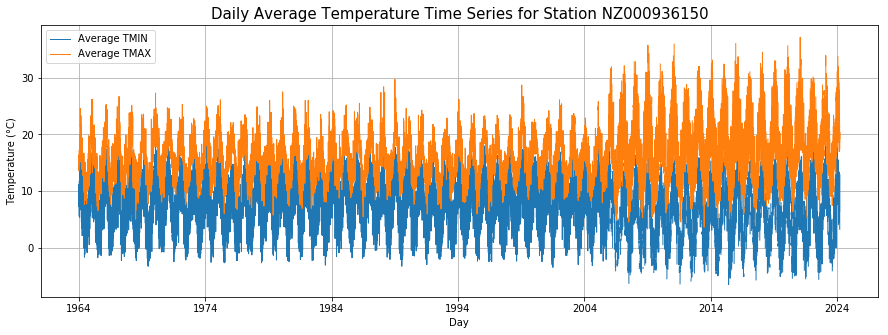

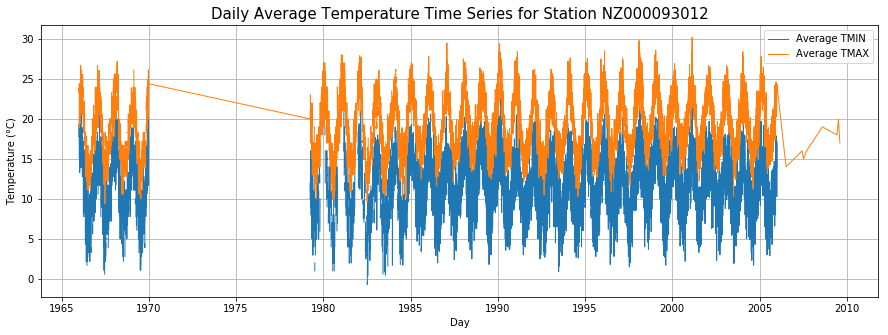

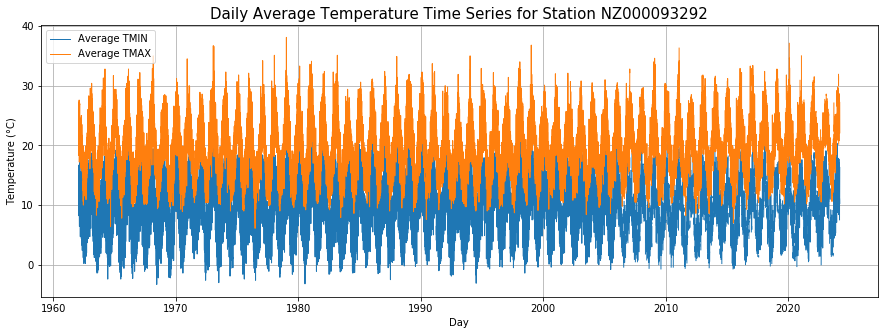

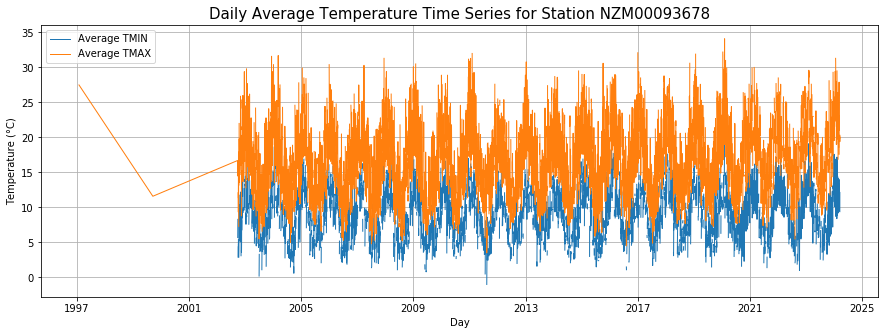

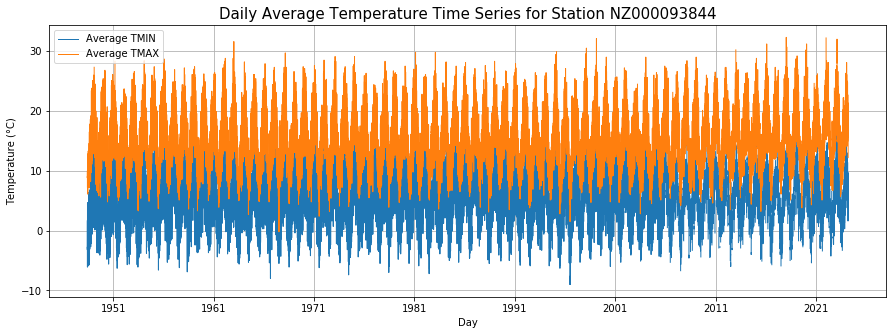

...

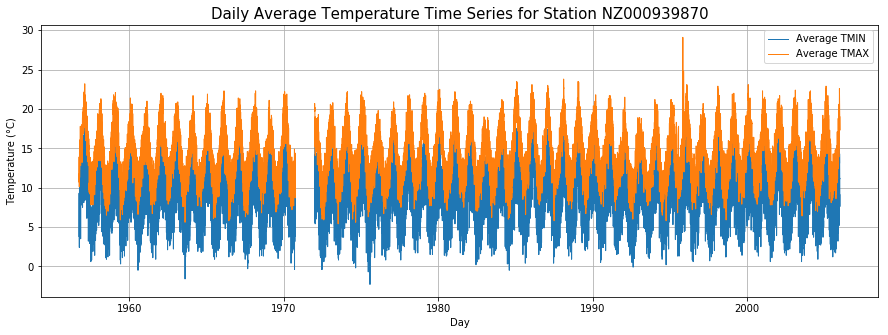

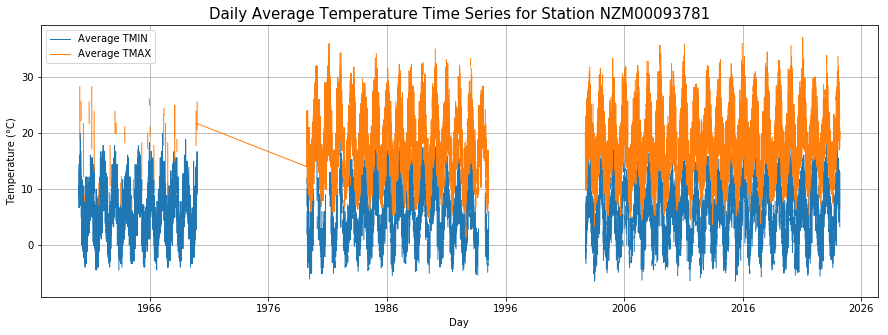

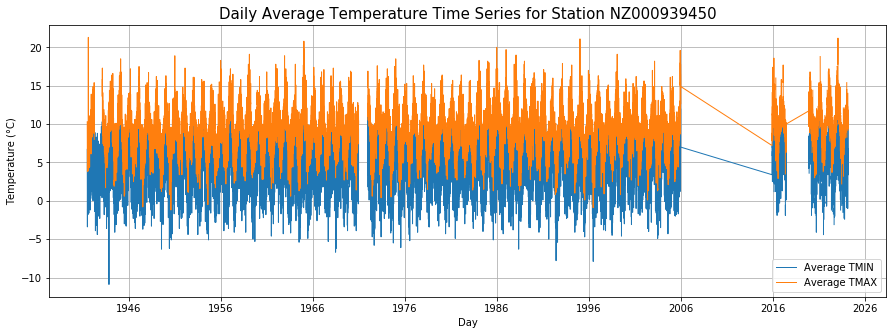

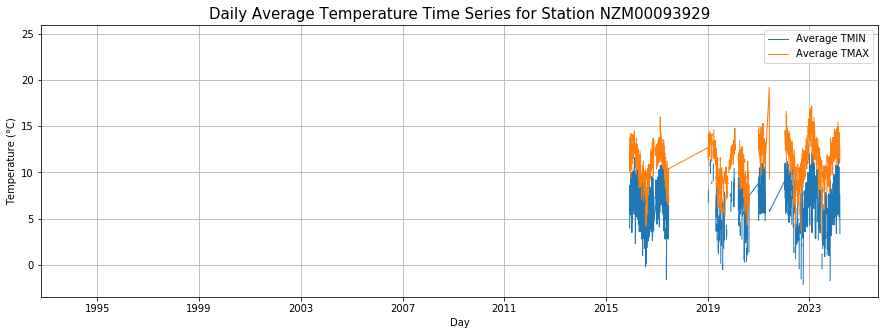

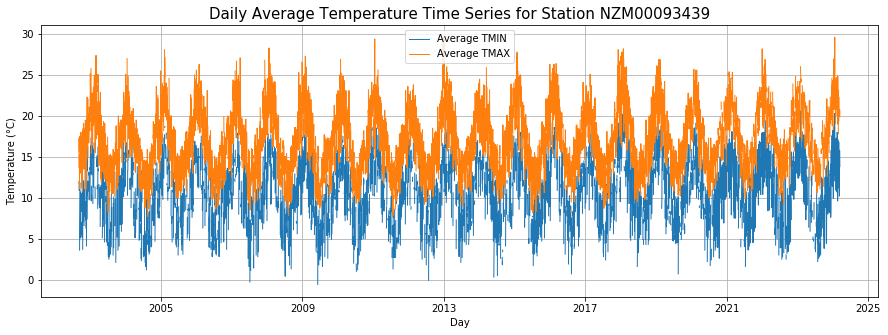

In [39]:
def plot_daily_time_series(spark_df, station_ids):
    for station_id in station_ids:
        
        daily_avg = spark_df.filter(spark_df['ID'] == station_id) \
                            .groupBy('ID', F.to_date('DATE').alias('Day')) \
                            .agg(F.mean('TMIN').alias('Avg_TMIN'), 
                                 F.mean('TMAX').alias('Avg_TMAX'))

        # Convert to Pandas DataFrame
        pd_df = daily_avg.toPandas()
        
        # Ensure the 'Day' column is a datetime type
        pd_df['Day'] = pd.to_datetime(pd_df['Day'])
        
        
        pd_df.sort_values('Day', inplace=True)

        # Plot
        plt.figure(figsize=(15, 5))
        plt.plot(pd_df['Day'], pd_df['Avg_TMIN'], label='Average TMIN', marker='', linestyle='-', linewidth=1)
        plt.plot(pd_df['Day'], pd_df['Avg_TMAX'], label='Average TMAX', marker='', linestyle='-', linewidth=1)
        
        plt.title(f"Daily Average Temperature Time Series for Station {station_id}", fontsize=15)
        plt.xlabel('Day')
        plt.ylabel('Temperature (°C)')
        plt.legend()
        plt.grid(True)
        
    
        
        plt.show()

plot_daily_time_series(nz_data_pivoted, station_ids)

## Monthly Time Series in each station

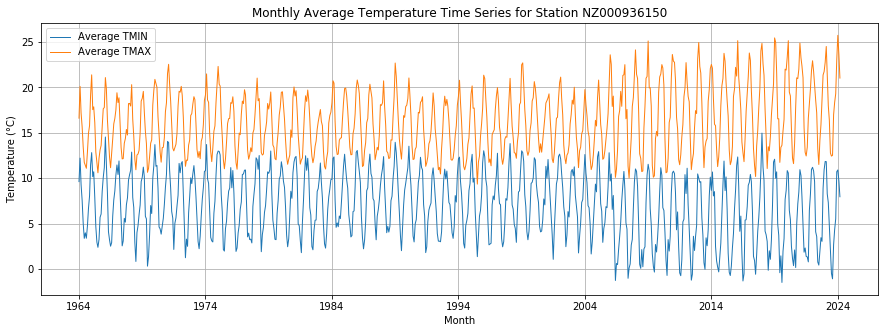

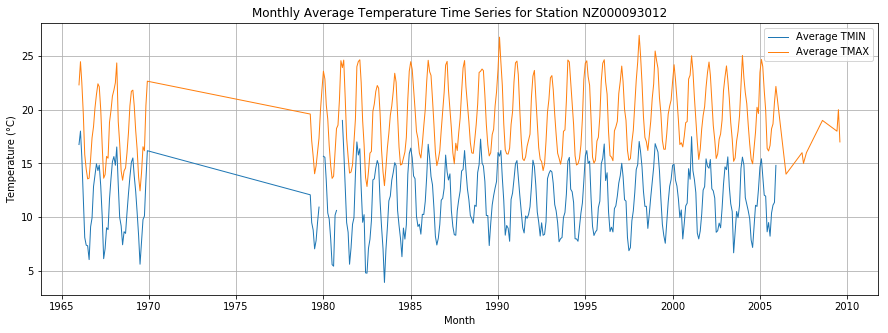

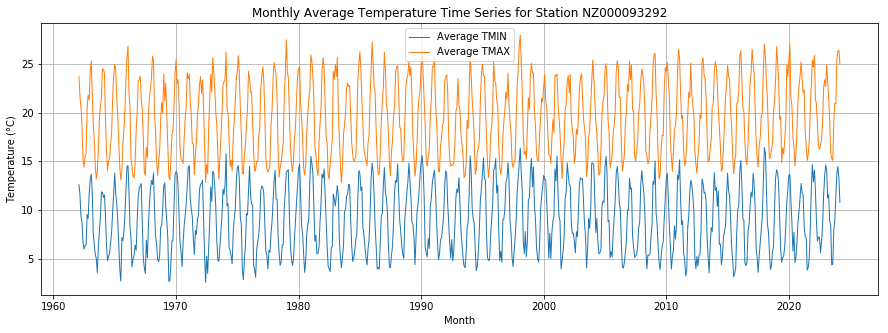

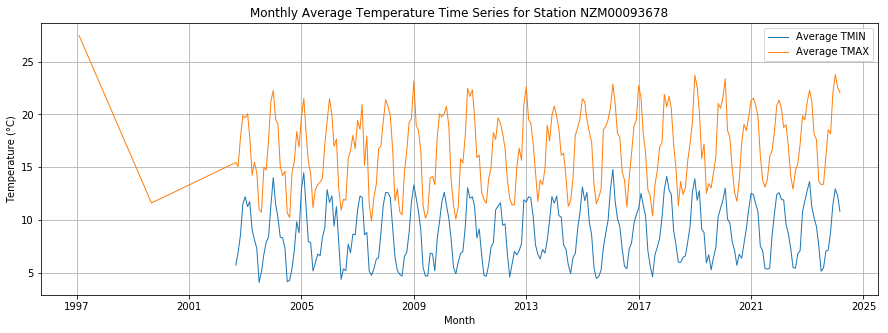

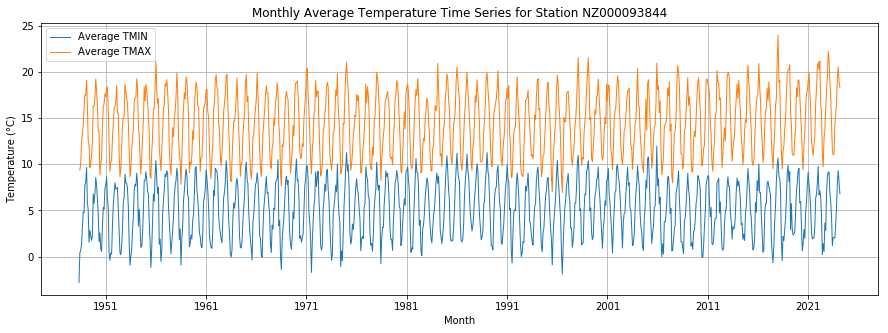

...

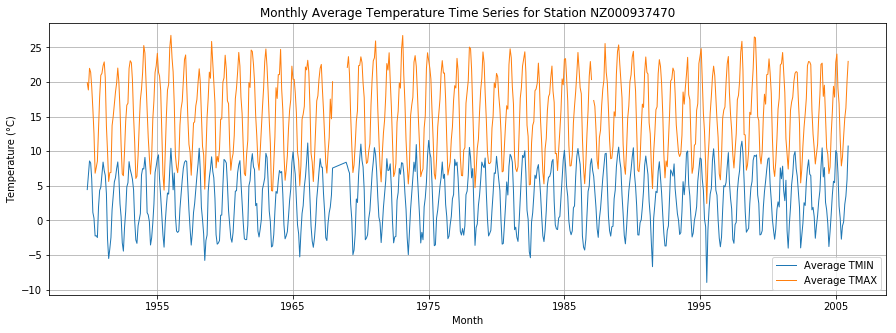

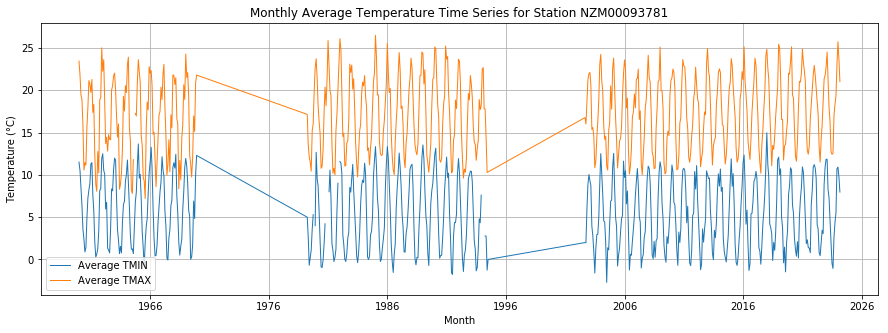

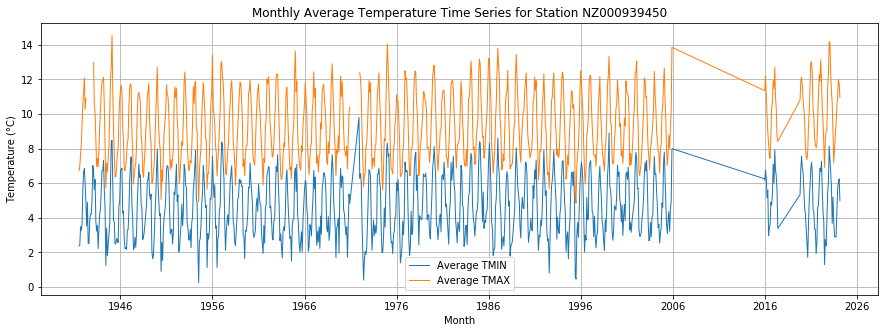

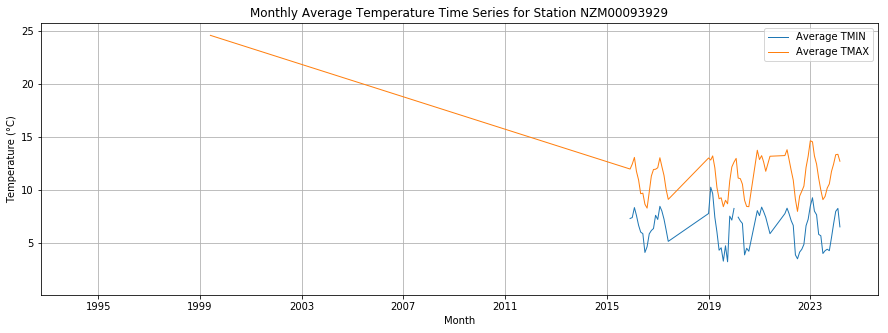

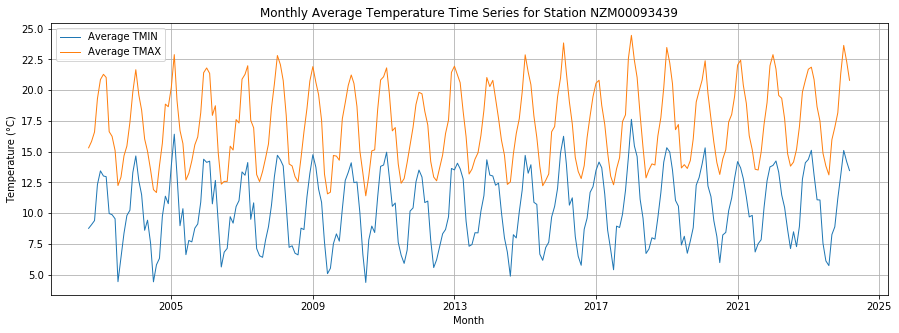

In [20]:
import matplotlib.dates as mdates

def plot_time_series(spark_df, station_ids):
    for station_id in station_ids:
        monthly_avg = spark_df.filter(spark_df['ID'] == station_id) \
                              .groupBy('ID', F.date_format('DATE', 'yyyy-MM').alias('Month')) \
                              .agg(F.mean('TMIN').alias('Avg_TMIN'), 
                                   F.mean('TMAX').alias('Avg_TMAX'))

        
        pd_df = monthly_avg.toPandas()
        pd_df['Month'] = pd.to_datetime(pd_df['Month'])
        pd_df.sort_values('Month', inplace=True)

        # Plot
        plt.figure(figsize=(15, 5))
        plt.plot(pd_df['Month'], pd_df['Avg_TMIN'], label='Average TMIN', marker='', linestyle='-', linewidth=1)
        plt.plot(pd_df['Month'], pd_df['Avg_TMAX'], label='Average TMAX', marker='', linestyle='-', linewidth=1)
        
        plt.title(f"Monthly Average Temperature Time Series for Station {station_id}",fontsize=15)
        plt.xlabel('Month')
        plt.ylabel('Temperature (°C)')
        plt.legend()
        plt.grid(True)
        plt.show()


plot_time_series(nz_data_pivoted, station_ids)

## Quarterly Time Series in each station

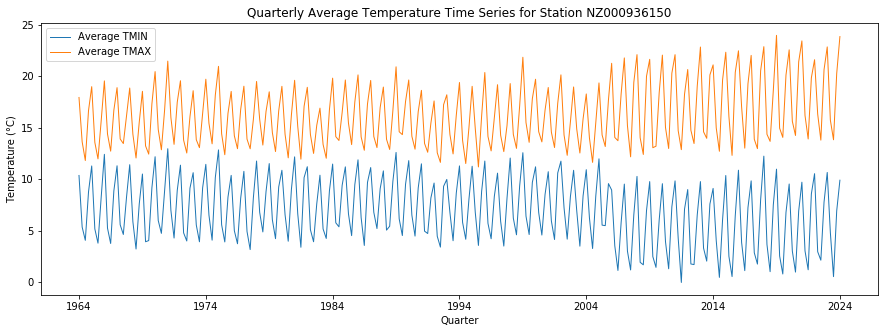

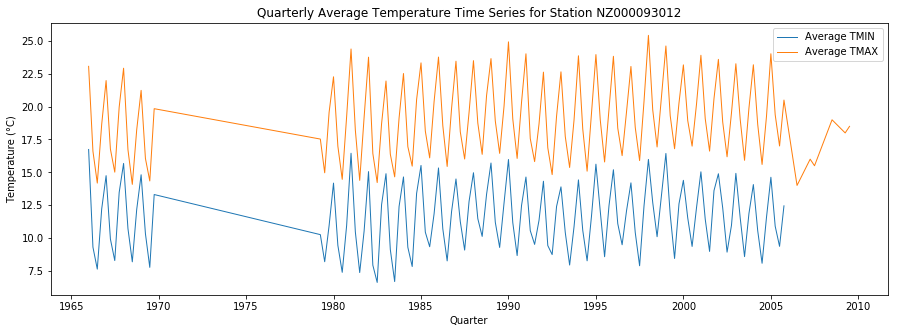

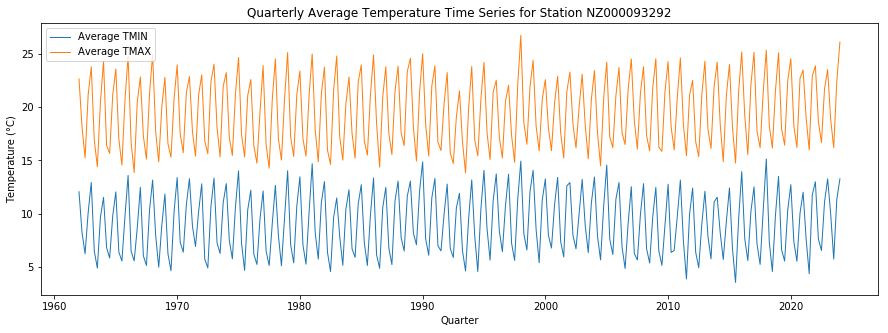

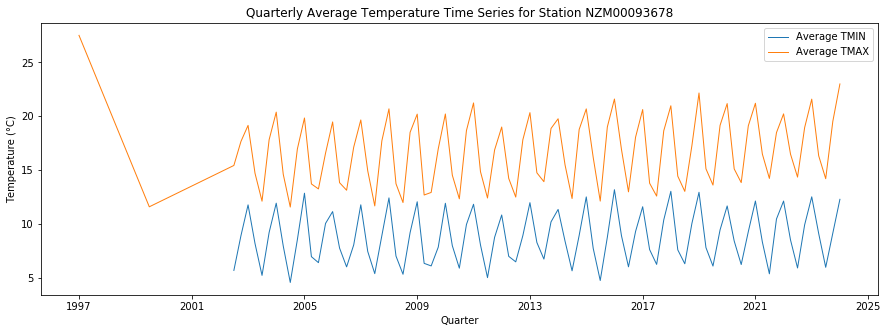

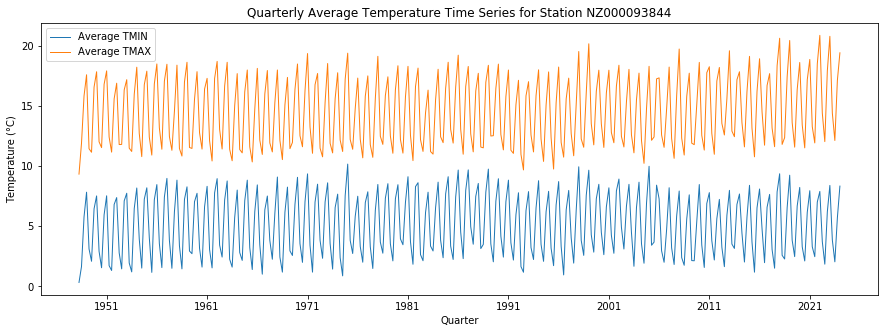

...

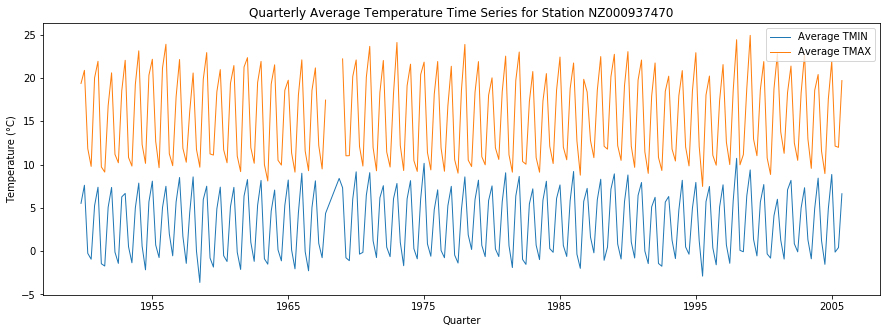

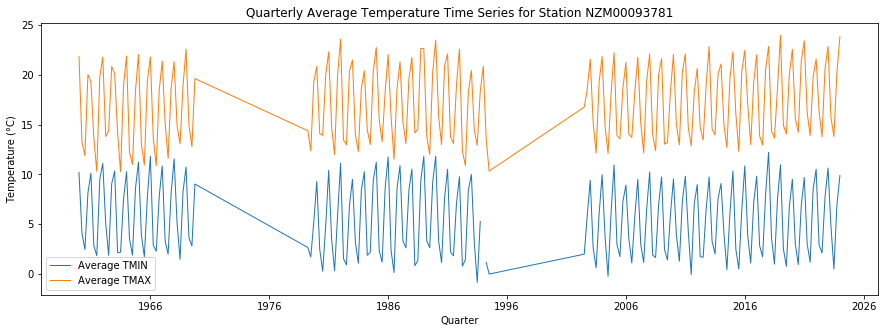

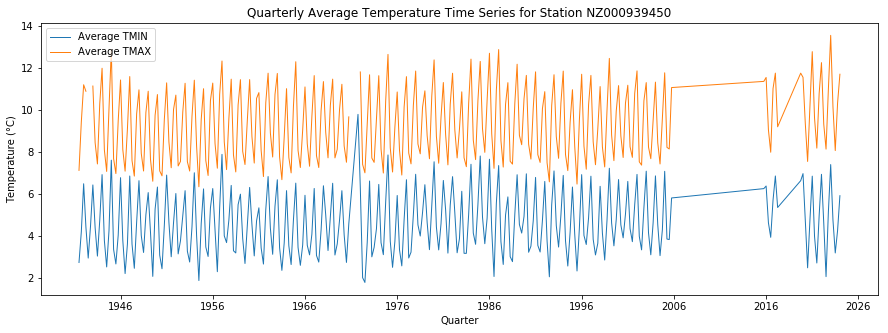

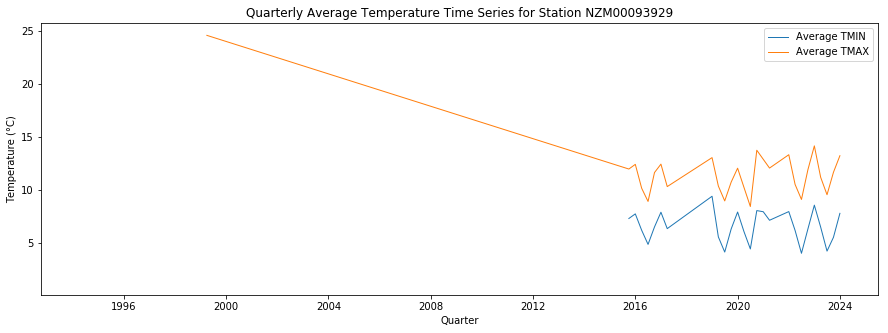

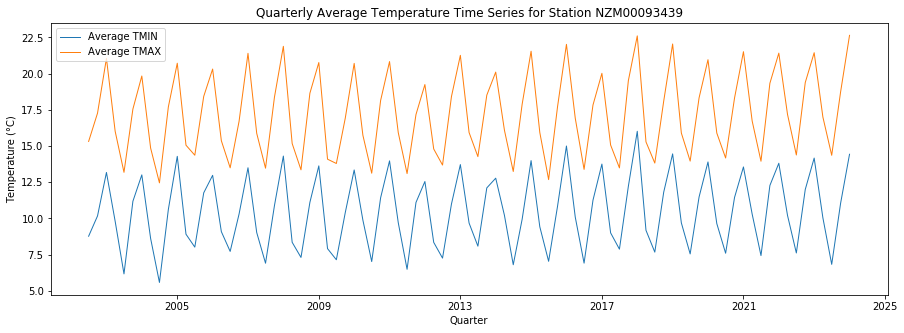

In [29]:
def plot_quarterly_time_series(spark_df, station_ids):
    for station_id in station_ids:
       
        quarterly_avg = spark_df.filter(spark_df['ID'] == station_id) \
                                .groupBy('ID', F.year('DATE').alias('Year'), F.quarter('DATE').alias('Quarter')) \
                                .agg(F.mean('TMIN').alias('Avg_TMIN'), 
                                     F.mean('TMAX').alias('Avg_TMAX'))

        
        quarterly_avg = quarterly_avg.withColumn("YearQuarter", F.concat_ws('-Q', F.col("Year"), F.col("Quarter")))
        
        pd_df = quarterly_avg.toPandas()
        pd_df['YearQuarter'] = pd.to_datetime(pd_df['YearQuarter'])

        pd_df.sort_values('YearQuarter', inplace=True)

        # Plot
        plt.figure(figsize=(15, 5))
        plt.plot(pd_df['YearQuarter'], pd_df['Avg_TMIN'], label='Average TMIN', marker='', linestyle='-', linewidth=1)
        plt.plot(pd_df['YearQuarter'], pd_df['Avg_TMAX'], label='Average TMAX', marker='', linestyle='-', linewidth=1)

        plt.title(f"Quarterly Average Temperature Time Series for Station {station_id}",fontsize=15)
        plt.xlabel('Quarter')
        plt.ylabel('Temperature (°C)')
        plt.legend()
    
        plt.show()


plot_quarterly_time_series(nz_data_pivoted, station_ids)


## Yearly Time Series in each station

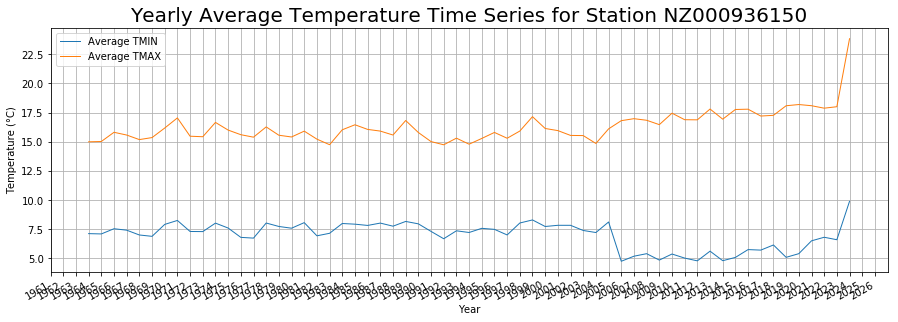

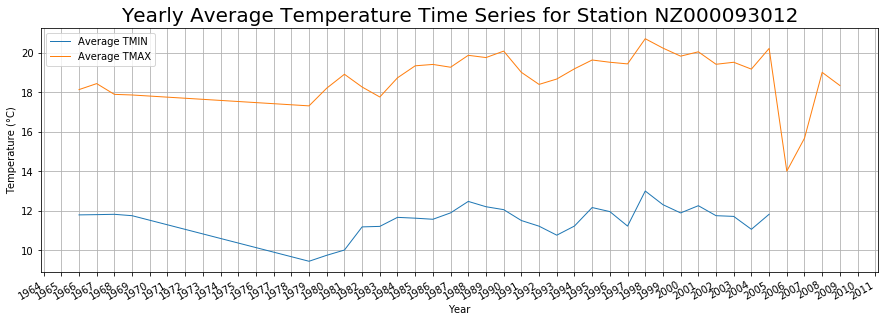

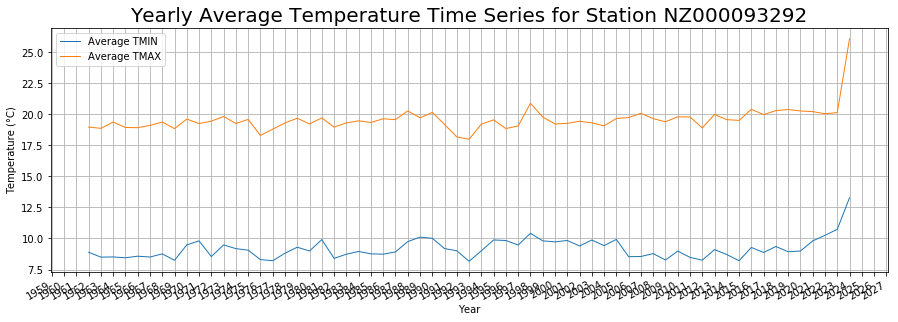

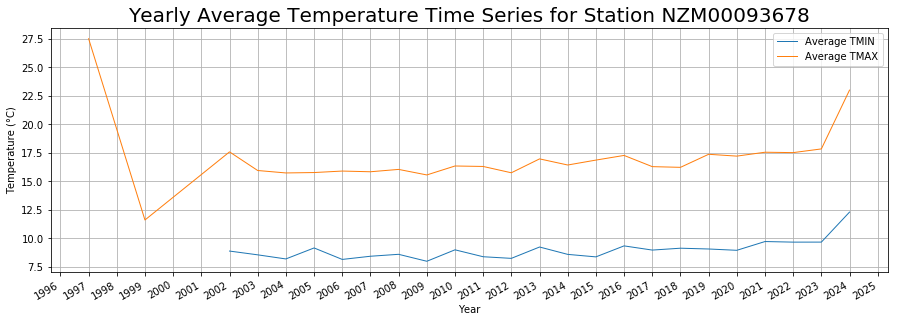

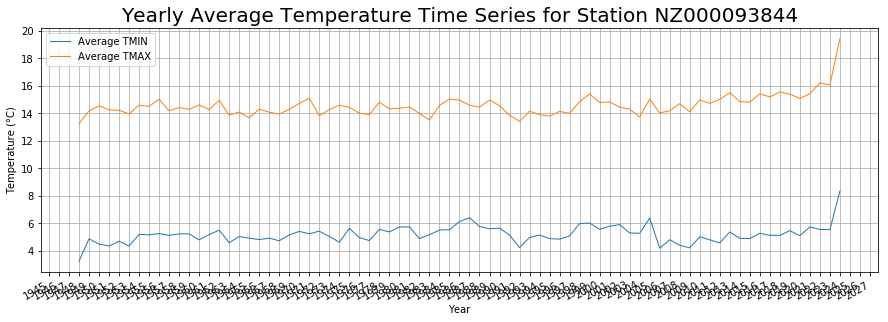

...

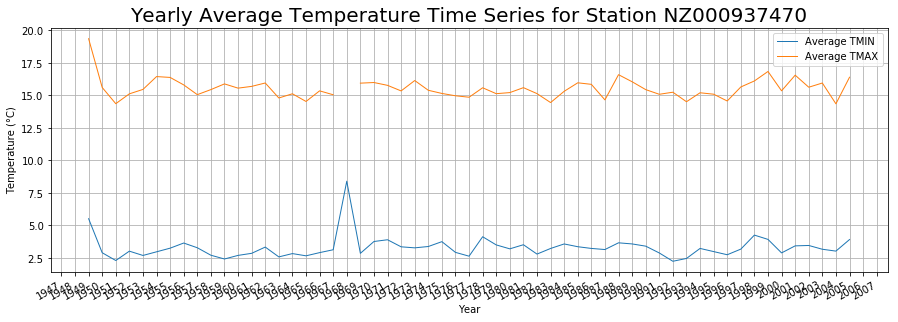

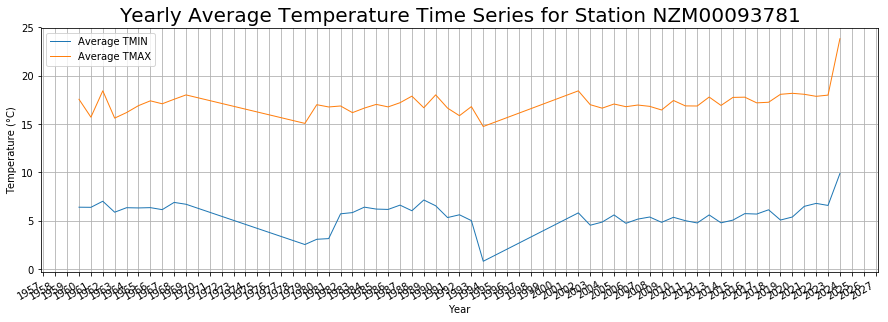

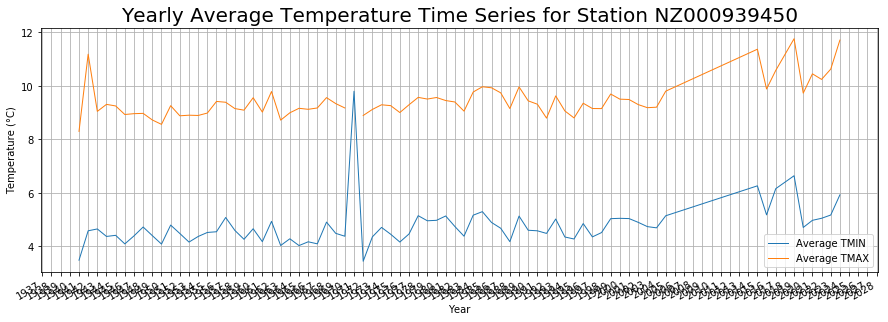

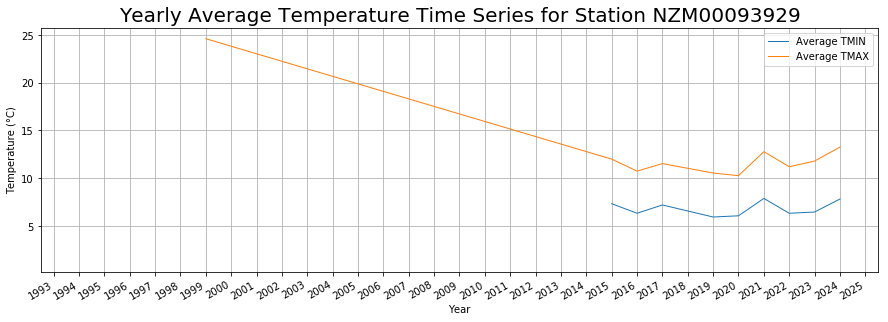

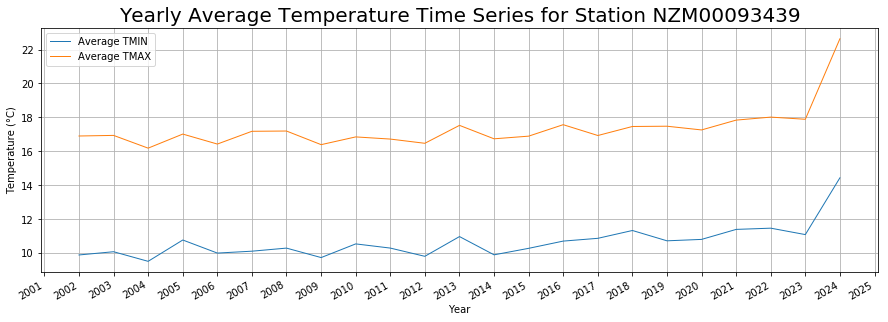

In [37]:
def plot_yearly_time_series(spark_df, station_ids):
    for station_id in station_ids:
        
        yearly_avg = spark_df.filter(spark_df['ID'] == station_id) \
                             .groupBy('ID', F.year('DATE').alias('Year')) \
                             .agg(F.mean('TMIN').alias('Avg_TMIN'), 
                                  F.mean('TMAX').alias('Avg_TMAX'))

        # Convert to Pandas DataFrame
        pd_df = yearly_avg.toPandas()

        
        pd_df['Year'] = pd.to_datetime(pd_df['Year'], format='%Y')
        pd_df.sort_values('Year', inplace=True)

        # Plot
        plt.figure(figsize=(15, 5))
        plt.plot(pd_df['Year'], pd_df['Avg_TMIN'], label='Average TMIN', marker='', linestyle='-', linewidth=1)
        plt.plot(pd_df['Year'], pd_df['Avg_TMAX'], label='Average TMAX', marker='', linestyle='-', linewidth=1)
        
        plt.title(f"Yearly Average Temperature Time Series for Station {station_id}",fontsize=20)
        plt.xlabel('Year')
        plt.ylabel('Temperature (°C)')
        plt.legend()
        plt.grid(True)
        plt.gca().xaxis.set_major_locator(mdates.YearLocator())
        plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
        plt.gcf().autofmt_xdate()  
        plt.show()


plot_yearly_time_series(nz_data_pivoted, station_ids)

## Average Daily Time Series in New Zealand

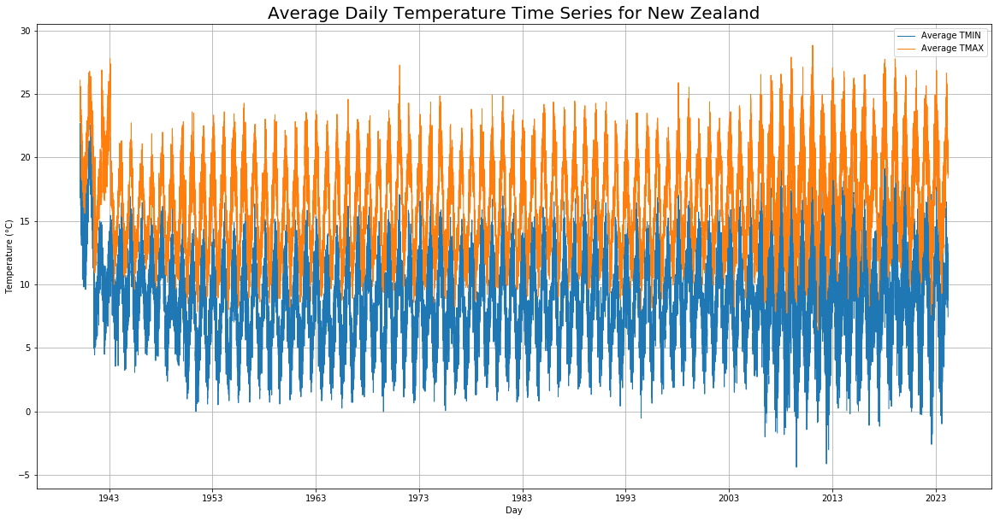

In [44]:
nz_daily_avg_data = nz_data_pivoted.withColumn("Day", F.col("DATE").cast("date")) \
                                   .groupBy("Day") \
                                   .agg(F.avg("TMIN").alias("Avg_TMIN"), 
                                        F.avg("TMAX").alias("Avg_TMAX")) \
                                   .orderBy("Day") \
                                   .toPandas()

# Convert 'Day' from timestamp to date (removing time part for better plotting)
nz_daily_avg_data['Day'] = pd.to_datetime(nz_daily_avg_data['Day']).dt.date

# Plotting the daily data
plt.figure(figsize=(20, 10))
plt.plot(nz_daily_avg_data['Day'], nz_daily_avg_data['Avg_TMIN'], label='Average TMIN', marker='', linestyle='-', linewidth=1)
plt.plot(nz_daily_avg_data['Day'], nz_daily_avg_data['Avg_TMAX'], label='Average TMAX', marker='', linestyle='-', linewidth=1)
plt.title("Average Daily Temperature Time Series for New Zealand", fontsize=20)
plt.xlabel('Day')
plt.ylabel('Temperature (°C)')
plt.legend()
plt.grid(True)


plt.show()


## Average Monthly Time Series in New Zealand

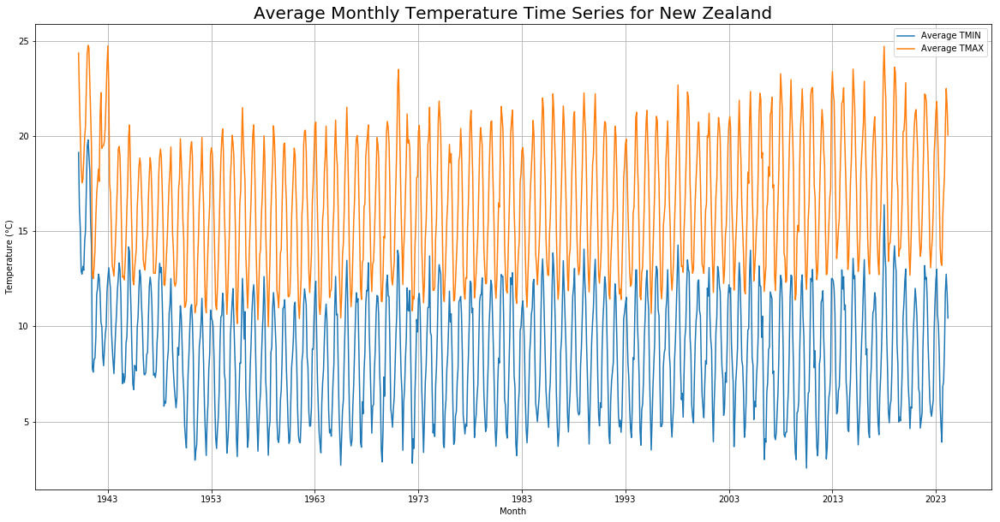

In [40]:
nz_avg_data = nz_data_pivoted.withColumn("Month", F.date_trunc('month', F.col("DATE"))) \
                             .groupBy("Month") \
                             .agg(F.avg("TMIN").alias("Avg_TMIN"), 
                                  F.avg("TMAX").alias("Avg_TMAX")) \
                             .orderBy("Month") \
                             .toPandas()

# Convert 'Month' from timestamp to date (removing time part for better plotting)
nz_avg_data['Month'] = pd.to_datetime(nz_avg_data['Month']).dt.date

# Plotting the monthly data
plt.figure(figsize=(20, 10))
plt.plot(nz_avg_data['Month'], nz_avg_data['Avg_TMIN'], label='Average TMIN', marker='')
plt.plot(nz_avg_data['Month'], nz_avg_data['Avg_TMAX'], label='Average TMAX', marker='')
plt.title("Average Monthly Temperature Time Series for New Zealand",fontsize=20)
plt.xlabel('Month')
plt.ylabel('Temperature (°C)')
plt.legend()


plt.grid(True)
plt.show()

### Group the precipitation observations by year and country. Compute the average rainfall
### in each year for each country, and save this result to your output directory.

In [11]:
show_as_html(All_data_df,10)
All_data_df.printSchema()

,ID,DATE,ELEMENT,VALUE,MEASUREMENT_FLAG,QUALITY_FLAG,SOURCE_FLAG,OBSERVATION_TIME,STATE,CODE,...,HCN_CRN_FLAG,WMO_ID,Country_Name,State_Name,FIRST_ACTIVE_YEAR,LAST_ACTIVE_YEAR,DIFFERENT_ELEMENTS_COUNT,CORE_ELEMENTS_COUNT,OTHER_ELEMENTS_COUNT,COLLECTED_ELEMENTS
0,AE000041196,20100101,TMAX,259.0,None,None,S,NaT,,AE,...,,41196,United Arab Emirates,None,1944,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
1,AE000041196,20100101,TMIN,120.0,None,None,S,NaT,,AE,...,,41196,United Arab Emirates,None,1944,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
2,AE000041196,20100101,TAVG,181.0,H,None,S,NaT,,AE,...,,41196,United Arab Emirates,None,1944,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
3,AEM00041194,20100101,TMAX,250.0,None,None,S,NaT,,AE,...,,41194,United Arab Emirates,None,1983,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
4,AEM00041194,20100101,TMIN,168.0,None,None,S,NaT,,AE,...,,41194,United Arab Emirates,None,1983,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
5,AEM00041194,20100101,PRCP,0.0,None,None,S,NaT,,AE,...,,41194,United Arab Emirates,None,1983,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
6,AEM00041194,20100101,TAVG,194.0,H,None,S,NaT,,AE,...,,41194,United Arab Emirates,None,1983,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
7,AEM00041217,20100101,TMAX,250.0,None,None,S,NaT,,AE,...,,41217,United Arab Emirates,None,1983,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
8,AEM00041217,20100101,TMIN,146.0,None,None,S,NaT,,AE,...,,41217,United Arab Emirates,None,1983,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"
9,AEM00041217,20100101,TAVG,199.0,H,None,S,NaT,,AE,...,,41217,United Arab Emirates,None,1983,2024,4,3,1,"[TMAX, TMIN, PRCP, TAVG]"


root
 |-- ID: string (nullable = true)
 |-- DATE: string (nullable = true)
 |-- ELEMENT: string (nullable = true)
 |-- VALUE: float (nullable = true)
 |-- MEASUREMENT_FLAG: string (nullable = true)
 |-- QUALITY_FLAG: string (nullable = true)
 |-- SOURCE_FLAG: string (nullable = true)
 |-- OBSERVATION_TIME: timestamp (nullable = true)
 |-- STATE: string (nullable = true)
 |-- CODE: string (nullable = true)
 |-- LATITUDE: string (nullable = true)
 |-- LONGITUDE: string (nullable = true)
 |-- ELEVATION: string (nullable = true)
 |-- NAME: string (nullable = true)
 |-- GSN_FLAG: string (nullable = true)
 |-- HCN_CRN_FLAG: string (nullable = true)
 |-- WMO_ID: string (nullable = true)
 |-- Country_Name: string (nullable = true)
 |-- State_Name: string (nullable = true)
 |-- FIRST_ACTIVE_YEAR: string (nullable = true)
 |-- LAST_ACTIVE_YEAR: string (nullable = true)
 |-- DIFFERENT_ELEMENTS_COUNT: long (nullable = true)
 |-- CORE_ELEMENTS_COUNT: long (nullable = true)
 |-- OTHER_ELEMENTS_COUNT

In [14]:
from pyspark.sql.types import IntegerType
from pyspark.sql.functions import col, sum as spark_sum, countDistinct 

Step 1: Filter Precipitation Data

In [12]:
rainfall_daily_data = All_data_df.filter(All_data_df["ELEMENT"] == "PRCP")

In [19]:
rainfall_daily_data.printSchema()

root
 |-- ID: string (nullable = true)
 |-- DATE: string (nullable = true)
 |-- ELEMENT: string (nullable = true)
 |-- VALUE: float (nullable = true)
 |-- MEASUREMENT_FLAG: string (nullable = true)
 |-- QUALITY_FLAG: string (nullable = true)
 |-- SOURCE_FLAG: string (nullable = true)
 |-- OBSERVATION_TIME: timestamp (nullable = true)
 |-- STATE: string (nullable = true)
 |-- CODE: string (nullable = true)
 |-- LATITUDE: string (nullable = true)
 |-- LONGITUDE: string (nullable = true)
 |-- ELEVATION: string (nullable = true)
 |-- NAME: string (nullable = true)
 |-- GSN_FLAG: string (nullable = true)
 |-- HCN_CRN_FLAG: string (nullable = true)
 |-- WMO_ID: string (nullable = true)
 |-- Country_Name: string (nullable = true)
 |-- State_Name: string (nullable = true)
 |-- FIRST_ACTIVE_YEAR: string (nullable = true)
 |-- LAST_ACTIVE_YEAR: string (nullable = true)
 |-- DIFFERENT_ELEMENTS_COUNT: long (nullable = true)
 |-- CORE_ELEMENTS_COUNT: long (nullable = true)
 |-- OTHER_ELEMENTS_COUNT

Step 2: Group and Compute Average Daily Rainfall

In [15]:
# Group by country and date, then calculate total daily rainfall and unique station count
average_rainfall_daily = (
    rainfall_daily_data
    .groupBy("Country_Name", "DATE")
    .agg(
        F.sum("VALUE").alias("TOTAL_DAILY_RAINFALL"),  # Total daily rainfall
        F.countDistinct("ID").alias("Unique_Station_Count")  # Unique station count
    )
    # Compute average daily rainfall
    .withColumn("AVERAGE_DAILY_RAINFALL", F.col("TOTAL_DAILY_RAINFALL") / F.col("Unique_Station_Count"))
)

In [16]:
# Extract year from the date and compute annual average rainfall
avg_rainfall = (
    average_rainfall_daily
    .withColumn("YEAR", F.year(F.to_timestamp("DATE", 'yyyyMMdd')))  # Extract year
    .groupBy("Country_Name", "YEAR")  # Group by country and year
    .agg(
        F.sum("AVERAGE_DAILY_RAINFALL").alias("AVG_RAINFALL")  # Sum average daily rainfall
    )
    # Adjust for different measurement units and round to 3 decimal places
    .withColumn("AVG_RAINFALL", F.round(F.col("AVG_RAINFALL") / 10, 3)) 
)

In [17]:
avg_rainfall.show()

+--------------------+----+------------+
|        Country_Name|YEAR|AVG_RAINFALL|
+--------------------+----+------------+
|          Argentina |2009|     1913.37|
|            Cambodia|2009|         9.9|
|             Albania|1983|    1130.883|
|            Algeria |1942|     143.333|
|            Algeria |1963|     242.503|
|            Algeria |1968|      187.25|
|            Algeria |1987|     341.233|
|            Algeria |2005|     312.213|
|American Samoa [U...|1974|    3015.967|
|          Argentina |1977|     889.764|
|            Armenia |1929|     409.533|
|            Armenia |1958|     467.693|
|            Armenia |1962|     476.678|
|            Armenia |1982|     532.246|
|          Australia |1873|      797.45|
|          Australia |1880|     558.421|
|          Australia |1888|     398.137|
|          Australia |1954|     714.298|
|            Austria |1942|       812.5|
|            Austria |1948|     973.667|
+--------------------+----+------------+
only showing top

In [86]:
output_dir_3 = "hdfs:///user/uwi14/outputs/ghcnd/avg_rainfall.csv"
avg_rainfall.write.mode("overwrite").option("header", "true").option("compression", "gzip").csv(output_dir_3)

### Which country has the highest average rainfall in a single year across the entire dataset?
### Is this result sensible? Is this result consistent with your previous analysis?

In [18]:
highest_avg_rainfall = (avg_rainfall
                        .orderBy(F.desc("AVG_RAINFALL")))
highest_avg_rainfall.show()

+--------------------+----+------------+
|        Country_Name|YEAR|AVG_RAINFALL|
+--------------------+----+------------+
|New Caledonia [Fr...|1999|     17674.4|
|New Caledonia [Fr...|1976|     17169.5|
|New Caledonia [Fr...|1967|     16589.0|
|New Caledonia [Fr...|1956|     15301.0|
|New Caledonia [Fr...|1961|     15060.0|
|New Caledonia [Fr...|1954|     14168.0|
|New Caledonia [Fr...|1972|     13429.0|
|         Antarctica |1999|   12997.729|
|New Caledonia [Fr...|1962|     12516.0|
|New Caledonia [Fr...|1951|     11209.0|
|              Chile |1975|   11195.223|
|New Caledonia [Fr...|1960|     11091.0|
|New Caledonia [Fr...|1971|     10943.0|
|New Caledonia [Fr...|1975|     10866.5|
|New Caledonia [Fr...|1958|     10770.0|
|New Caledonia [Fr...|1963|     10321.0|
|New Caledonia [Fr...|1970|     10011.0|
|New Caledonia [Fr...|1955|      9860.0|
|New Caledonia [Fr...|1959|      9802.0|
|New Caledonia [Fr...|1964|      9670.0|
+--------------------+----+------------+
only showing top

In [27]:
highest_avg_rainfall_country = highest_avg_rainfall.first()

highest_country = highest_avg_rainfall_country["Country_Name"]
highest_year = highest_avg_rainfall_country["YEAR"]
highest_rainfall = highest_avg_rainfall_country["AVG_RAINFALL"]

print(f"The country with the highest average rainfall is {highest_country} in the year {highest_year} with an average rainfall of {highest_rainfall}.")

The country with the highest average rainfall is New Caledonia [France]  in the year 1999 with an average rainfall of 17674.4.


In [23]:
New_Caledonia_data = rainfall_daily_data.filter(
    rainfall_daily_data["Country_Name"].contains("New Caledonia")
)

New_Caledonia_data = New_Caledonia_data.withColumn("YEAR", F.year(F.to_timestamp("DATE", 'yyyyMMdd')))

New_Caledonia_data.show(100)

+-----------+--------+-------+-----+----------------+------------+-----------+----------------+-----+----+--------+---------+---------+--------------------+--------+------------+------+--------------------+----------+-----------------+----------------+------------------------+-------------------+--------------------+--------------------+----+
|         ID|    DATE|ELEMENT|VALUE|MEASUREMENT_FLAG|QUALITY_FLAG|SOURCE_FLAG|OBSERVATION_TIME|STATE|CODE|LATITUDE|LONGITUDE|ELEVATION|                NAME|GSN_FLAG|HCN_CRN_FLAG|WMO_ID|        Country_Name|State_Name|FIRST_ACTIVE_YEAR|LAST_ACTIVE_YEAR|DIFFERENT_ELEMENTS_COUNT|CORE_ELEMENTS_COUNT|OTHER_ELEMENTS_COUNT|  COLLECTED_ELEMENTS|YEAR|
+-----------+--------+-------+-----+----------------+------------+-----------+----------------+-----+----+--------+---------+---------+--------------------+--------+------------+------+--------------------+----------+-----------------+----------------+------------------------+-------------------+-------------

In [24]:
#Filtering the data for year 1999

New_Caledonia_data = New_Caledonia_data.filter(
    New_Caledonia_data["YEAR"]==1999)
New_Caledonia_data.show()

+-----------+--------+-------+------+----------------+------------+-----------+----------------+-----+----+--------+---------+---------+--------------------+--------+------------+------+--------------------+----------+-----------------+----------------+------------------------+-------------------+--------------------+--------------------+----+
|         ID|    DATE|ELEMENT| VALUE|MEASUREMENT_FLAG|QUALITY_FLAG|SOURCE_FLAG|OBSERVATION_TIME|STATE|CODE|LATITUDE|LONGITUDE|ELEVATION|                NAME|GSN_FLAG|HCN_CRN_FLAG|WMO_ID|        Country_Name|State_Name|FIRST_ACTIVE_YEAR|LAST_ACTIVE_YEAR|DIFFERENT_ELEMENTS_COUNT|CORE_ELEMENTS_COUNT|OTHER_ELEMENTS_COUNT|  COLLECTED_ELEMENTS|YEAR|
+-----------+--------+-------+------+----------------+------------+-----------+----------------+-----+----+--------+---------+---------+--------------------+--------+------------+------+--------------------+----------+-----------------+----------------+------------------------+-------------------+----------

In [26]:
unique_id_count_nc = New_Caledonia_data .agg(F.countDistinct("ID").alias("Unique_ID_Count"))

# Display the unique ID count
unique_id_count_nc.show()

+---------------+
|Unique_ID_Count|
+---------------+
|              2|
+---------------+



### Find an elegant way to plot the average rainfall in 2023 for each country. There are many ways that you could do this, such as using a choropleth to color a map based on average rainfall. Are there any gaps or missing values in your plot?

In [28]:
# Filter for 2023
avg_rainfall_2023 = avg_rainfall.filter(avg_rainfall["YEAR"] == 2023).toPandas()

In [47]:
output_path = "avg_rainfall_2023.csv" 

# Save the pandas DataFrame as a CSV file
avg_rainfall_2023.to_csv(output_path, index=False) 

In [39]:
import plotly.express as px


In [40]:

fig = px.choropleth(avg_rainfall_2023,
                    locations='Country_Name',  
                    locationmode='country names',  
                    color='AVG_RAINFALL',  
                    color_continuous_scale=px.colors.sequential.Plasma,  
                    )

fig.update_layout(
    title={
        'text': "Average Rainfall by Country in 2023",
        'y':0.88,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    width=1000,  
    height=600   
)


fig.show()

In [45]:
# Run this cell before closing the notebook or kill your spark application by hand using the link in the Spark UI

stop_spark()